# Introduction

While healthcare management has various use cases for using data science, patient length of stay is one critical parameter to observe and predict if one wants to improve the efficiency of the healthcare management in a hospital. This parameter helps hospitals to identify patients of high LOS risk (patients who will stay longer) at the time of admission. Once identified, patients with high LOS risk can have their treatment plan optimized to miminize LOS and lower the chance of staff/visitor infection. Also, prior knowledge of LOS can aid in logistics such as room and bed allocation planning.

The task here is to analyze the dataset and accurately predict the Length of Stay for each patient on case by case basis so that the Hospitals can use this information for optimal resource allocation and better functioning. The length of stay is divided into 11 different classes ranging from 0-10 days to more than 100 days.

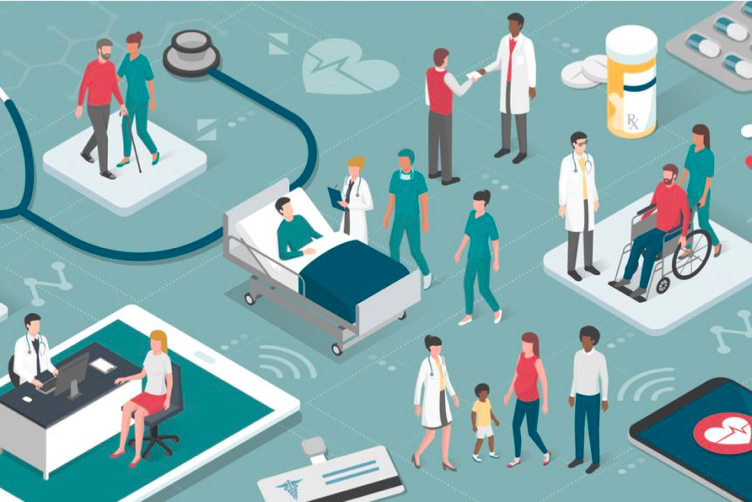

# 1. Importing datasets and relevant libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode (connected = True)

In [8]:
df=pd.read_csv('train_data.csv')
df['Count']=1
df.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10,1
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50,1
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40,1
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50,1
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50,1


As we can see, we have numerous columns showing information such as hospital code, hospital type code and many other such identifiers. While a detailed documentation is not available as to what these codes mean, we will preserve them as they could provide great insight for our machine learning.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 19 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

## Heatmap for missing values

<AxesSubplot:>

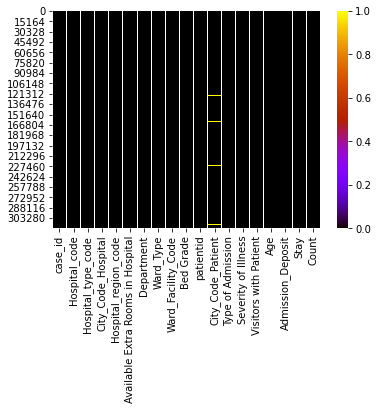

In [10]:
sns.heatmap(df.isna(),cmap='gnuplot')

In [11]:
df.isna().any()

case_id                              False
Hospital_code                        False
Hospital_type_code                   False
City_Code_Hospital                   False
Hospital_region_code                 False
Available Extra Rooms in Hospital    False
Department                           False
Ward_Type                            False
Ward_Facility_Code                   False
Bed Grade                             True
patientid                            False
City_Code_Patient                     True
Type of Admission                    False
Severity of Illness                  False
Visitors with Patient                False
Age                                  False
Admission_Deposit                    False
Stay                                 False
Count                                False
dtype: bool

As we can see, most of columns don't have any missing values associated to them. This is a very good sign that we are dealing with pre processed data.

# 2. Data Visualisations

Here, we shall emphasise on the EDA with the available data to find out some key insights.

## Hospital type code

Let us check which code of hospitals have the highest patient density.

In [13]:
df_hos_code=df.groupby('Hospital_type_code')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)

In [14]:
fig1=px.bar(df_hos_code,x='Hospital_type_code',y='Count',color='Count',labels={'Hospital_type_code':'Hospital Type Code','Count':'Number of patients'})
fig1.update_layout(title='Patient distribution per hospital type code',title_x=0.5,template='plotly_dark')
fig1.show()

As we can see, the hospital type **A** has a much higher patient case load when in comparison any of the other hospital codes. Hospital type **G** has the least case load. Hence, hospital type A has a much higher likelihood of running out of patient beds while G has the least. The ideal distribution would've been a uniform distribution where the under utilised beds of other hospital type codes may have been equally utilised.

## Hospital region code

The region code would likely divide all the available hospitals into three regions encoded as X,Y and Z. This will again let us know which hospital type belongs to which region and their corresponding case loads as well.

In [15]:
fig2=px.sunburst(df,path=['Hospital_region_code','Hospital_type_code'])
fig2.update_layout(title='Hospital region case load distribution',title_x=0.5)
fig2.show()

As we can see from the above sunburst plot, the case loads in hospital region **X** is marginally higher than hospital region **Y** and the least in region **Z** .  For region X, the hospital type A had highest case load while it was more equally balanced between a and b in region Y. For region Z, highest case loads were in hospital type C. Hospitals in region X seem to show better distribution amogst all the hospital types.

For region Y, distribution between A and B is ideal but f,d and g have been under utilised. For Z, cases in hospital c were easily the highest but a and d are extremely under utilised.

## Available Extra Rooms in Hospital

This is an important indicator as to how the hospital is coping with the case loads. Let us check how the extra rooms are distributed across the various hospitals.

In [16]:

fig3=px.histogram(df,x='Available Extra Rooms in Hospital',marginal='box',color_discrete_sequence=['orange'],opacity=0.7)
fig3.update_layout(template='plotly_dark',title='Number of hospitals with extra rooms',title_x=0.5)
fig3.show()

As we can see from the above histogram, majority of hospitals have extra rooms in the size of 2,3 or 4 rooms. The median extra rooms is 3.


## Available rooms Vs Region code

Let us check which region of X,Y and Z have most number of extra rooms available to them. Ideally, they should have a uniform distribution showing equal case loads. Let us check what the data says.

In [17]:
df_beds=df[['Hospital_code','Available Extra Rooms in Hospital','Hospital_region_code']]
df_beds['Hospital_region_code']=df_beds['Hospital_region_code'].map({'X':1,'Y':2,'Z':3})
df_beds_grouped=df_beds.groupby('Hospital_code')[['Available Extra Rooms in Hospital','Hospital_region_code']].median().reset_index()


<ipython-input-17-a49259a48fa3>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [18]:
df_beds_grouped['Hospital_region_code']=df_beds_grouped['Hospital_region_code'].map({1:'X',2:'Y',3:'Z'})
df_beds_grouped.head()

,Hospital_code,Available Extra Rooms in Hospital,Hospital_region_code
0,1,3,Y
1,2,2,Z
2,3,3,Z
3,4,3,X
4,5,3,X


In [19]:
df_beds_1=df_beds_grouped.groupby('Hospital_region_code')['Available Extra Rooms in Hospital'].sum().reset_index()
fig4=px.pie(df_beds_1,values='Available Extra Rooms in Hospital',names='Hospital_region_code',hole=0.4)
fig4.update_layout(title='Number of extra rooms in each region code',title_x=0.5)
fig4.update_traces(textinfo='percent+label')

From the above pie chart, we see that the number of extra available rooms are almost equally distributed amongst the three region codes. This is an ideal scenario.

## Department

Here, we shall check which departments have the highest number of case loads.


In [20]:
df_dept=df.groupby('Department')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)


In [21]:
fig5=px.bar(df_dept,x='Department',y='Count',color='Department',labels={'Count':'Number of patients'})
fig5.update_layout(title='Case load distribution per department',title_x=0.5,template='plotly_dark')
fig5.show()

From the above bar plot, we see that majority of the patients register themselves at the gynecology department. Surgery department has the least number of case loads. This is expected as daily birth cases are far higher than daily surgeries.


## Severity of illness

Let us check the number of patients of each severity of illness.

In [22]:
df_sev=df.groupby('Severity of Illness')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
fig6=px.funnel(df_sev,x='Count',y='Severity of Illness',labels={'Count':'Number of patients'},color='Count')
fig6.update_layout(title='Case load depending upon severity of illness',title_x=0.5,template='plotly_dark')
fig6.show()

From the above funnel plot, we see that most numner of cases are moderate in nature followed by minor and then, extreme.


## Age Vs Severity of illness

Let us check if there's any relation amongst age and severity of illness

In [23]:
fig7=px.sunburst(df,path=['Age','Severity of Illness'])
fig7.update_layout(title='Age (in years) and Severity of Illness',title_x=0.5)
fig7.show()

As we can see from the sunburst plot above, extreme cases are least for each age group. However, the extreme cases in relation to the moderate and minor cases seem to increase with higher age groups.


## Severity of illness Vs Stay

Let us check how the severity of illness and stay period changes.


In [24]:
fig8=px.sunburst(df,path=['Stay','Severity of Illness'])
fig8.update_layout(title='Stay period (in days) vs Severity of illness',title_x=0.5)
fig8.show()

From the above plot, it is seen that generally for lower stay duration(upto 20 days), the severity of illness is majorly minor or moderate. For higher stay duration, the extreme severity cases start rising.

21-30 days and 11-20 days are the most common stay periods across the hospitals.


# 3. Data wrangling

As we can see, we have a lot of data available to us. Some of these data provide us useful information while the other portion doesn't. A portion of the data is not numerical and for this purpose, we will have to wrangle with the data to either label encode or one hot encode them. 

In [25]:
df.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10,1
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50,1
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40,1
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50,1
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50,1


In [26]:
from sklearn.preprocessing import LabelEncoder

In [27]:
le=LabelEncoder()
df['Hospital_type_code_cat']=le.fit_transform(df['Hospital_type_code'])

In [28]:
df_reg_codes=pd.get_dummies(df['Hospital_region_code'])

df=pd.merge(df,df_reg_codes,on=df.index)

In [29]:
df.drop('key_0',axis=1,inplace=True)

In [30]:
df_dept=pd.get_dummies(df['Department'])
df=pd.merge(df,df_dept,on=df.index)
df.drop('key_0',axis=1,inplace=True)

In [31]:
df['Ward_Type_cat']=le.fit_transform(df['Ward_Type'])
df['Ward_Facility_Code_cat']=le.fit_transform(df['Ward_Facility_Code'])

In [32]:
df_adm=pd.get_dummies(df['Type of Admission'])
df=pd.merge(df,df_adm,on=df.index)
df.drop('key_0',axis=1,inplace=True)
df_sev_ill=pd.get_dummies(df['Severity of Illness'])
df=pd.merge(df,df_sev_ill,on=df.index)
df.drop('key_0',axis=1,inplace=True)

In [33]:
df['Age_cat']=le.fit_transform(df['Age'])
df['Stay_cat']=le.fit_transform(df['Stay'])

Now that we've either label encoded or one-hot encoded all the data, let us remove the previous categorical columns from the dataframe.

In [34]:
df_train=df.copy()

In [35]:
unn_cols=['case_id','Hospital_type_code','Hospital_region_code','Department','Ward_Type',
          'Ward_Facility_Code','Type of Admission','Severity of Illness','Age','Stay',
          'Count','Admission_Deposit','Bed Grade','City_Code_Patient']

for cols in unn_cols:
    df_train.drop(cols,axis=1,inplace=True)

In [36]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 318438 entries, 0 to 318437
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype
---  ------                             --------------   -----
 0   Hospital_code                      318438 non-null  int64
 1   City_Code_Hospital                 318438 non-null  int64
 2   Available Extra Rooms in Hospital  318438 non-null  int64
 3   patientid                          318438 non-null  int64
 4   Visitors with Patient              318438 non-null  int64
 5   Hospital_type_code_cat             318438 non-null  int32
 6   X                                  318438 non-null  uint8
 7   Y                                  318438 non-null  uint8
 8   Z                                  318438 non-null  uint8
 9   TB & Chest disease                 318438 non-null  uint8
 10  anesthesia                         318438 non-null  uint8
 11  gynecology                         318438 non-null  uint8
 12  ra

As we can see, all the available data is now in numerical form and hence, can be used for ML algorithms. Let us check the correlation of each feature with each other through a heatmap.

<AxesSubplot:>

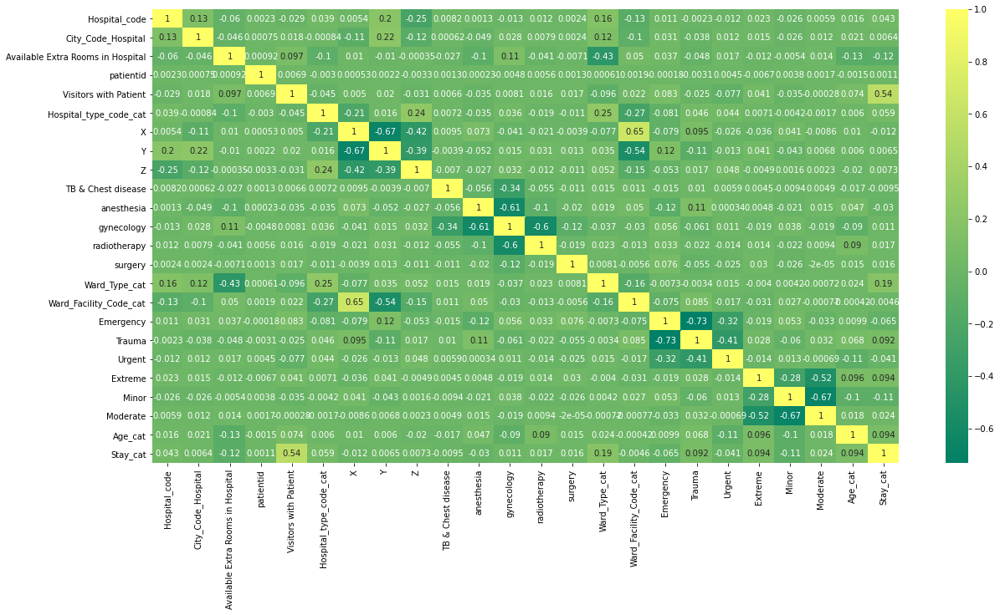

In [37]:
correlations=df_train.corr()
plt.figure(figsize=(20,10))
sns.heatmap(correlations,cmap='summer',annot=True,fmt='.2g')

# 4. Machine Learning


In this section, we shall apply some of the ML algorithms for correct classfication.

## Training phase

## a) Logistic Regression

In [38]:
target=df_train['Stay_cat']
train_df=df_train.iloc[:,:-1]

In [39]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
reg_log=LogisticRegression()

In [40]:
X_train,X_test,y_train,y_test=train_test_split(train_df,target,test_size=0.3,shuffle=True,random_state=0)


In [41]:
reg_log.fit(X_train,y_train)

LogisticRegression()

In [42]:
reg_log.score(X_train,y_train)

0.27111428135626675

In [43]:
y_predict_log=reg_log.predict(X_test)
reg_log.score(X_test,y_test)

0.26826613072059624

As we can see, the logistic regression has performed extremely poorly with only 28 % accuracy. Let us check another algorithm.


## b) Random Forest Classifier

In [44]:
from sklearn.ensemble import RandomForestClassifier

In [45]:
rfc=RandomForestClassifier(max_depth=10,random_state=0)

In [46]:
rfc.fit(X_train,y_train)
rfc.score(X_train,y_train)

0.4094147308731035

In [47]:
y_preds_rfc=rfc.predict(X_test)
rfc.score(X_test,y_test)

0.39467403592513506

We can see that the scores for Random Forest Classifier are better than logistic regression for a pre pruned max_depth of 10.


## c) CatBoost



In [49]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [50]:
from catboost import CatBoostClassifier

In [51]:
cb_clf=CatBoostClassifier(iterations=800,
                           learning_rate=0.08,
                           depth=8,
                           loss_function='MultiClass',
                           eval_metric='Accuracy')

In [52]:
cb_clf.fit(X_train,y_train)
cb_clf.score(X_train,y_train)

0:	learn: 0.3646963	total: 436ms	remaining: 5m 48s
1:	learn: 0.3760913	total: 728ms	remaining: 4m 50s
2:	learn: 0.3762124	total: 1.05s	remaining: 4m 40s
3:	learn: 0.3789490	total: 1.39s	remaining: 4m 37s
4:	learn: 0.3804249	total: 1.72s	remaining: 4m 33s
5:	learn: 0.3816138	total: 2.02s	remaining: 4m 26s
6:	learn: 0.3816497	total: 2.32s	remaining: 4m 22s
7:	learn: 0.3828520	total: 2.64s	remaining: 4m 21s
8:	learn: 0.3829955	total: 3.03s	remaining: 4m 26s
9:	learn: 0.3828834	total: 3.32s	remaining: 4m 22s
10:	learn: 0.3835428	total: 3.65s	remaining: 4m 21s
11:	learn: 0.3841933	total: 3.96s	remaining: 4m 20s
12:	learn: 0.3844894	total: 4.24s	remaining: 4m 16s
13:	learn: 0.3851040	total: 4.55s	remaining: 4m 15s
14:	learn: 0.3862256	total: 4.83s	remaining: 4m 12s
15:	learn: 0.3873606	total: 5.14s	remaining: 4m 12s
16:	learn: 0.3882803	total: 5.45s	remaining: 4m 11s
17:	learn: 0.3887154	total: 5.77s	remaining: 4m 10s
18:	learn: 0.3897831	total: 6.08s	remaining: 4m 9s
19:	learn: 0.3899985	to

0.46313692767354847

In [53]:
y_preds_cb=cb_clf.predict(X_test)
cb_clf.score(X_test,y_test)

0.40133149101871624

As we can see, catboost seems to have done well at classifying the results better than the other algorithms. We shall use this for our test dataframe.

## Testing phase

In [54]:
df_test=pd.read_csv('test_data.csv')
df_test.head()

id_df=df_test['patientid']

In [55]:
df_test['Hospital_type_code_cat']=le.fit_transform(df_test['Hospital_type_code'])
df_reg_codes=pd.get_dummies(df_test['Hospital_region_code'])
df_test=pd.merge(df_test,df_reg_codes,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)
df_dept=pd.get_dummies(df_test['Department'])
df_test=pd.merge(df_test,df_dept,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)

df_test['Ward_Type_cat']=le.fit_transform(df_test['Ward_Type'])
df_test['Ward_Facility_Code_cat']=le.fit_transform(df_test['Ward_Facility_Code'])

df_adm=pd.get_dummies(df_test['Type of Admission'])
df_test=pd.merge(df_test,df_adm,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)
df_sev_ill=pd.get_dummies(df_test['Severity of Illness'])
df_test=pd.merge(df_test,df_sev_ill,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)


df_test['Age_cat']=le.fit_transform(df_test['Age'])


In [56]:
unn_cols=['Hospital_type_code','Hospital_region_code','Department','Ward_Type',
          'Ward_Facility_Code','Type of Admission','Severity of Illness','Age',
          'Admission_Deposit','Bed Grade','City_Code_Patient']

for cols in unn_cols:
    df_test.drop(cols,axis=1,inplace=True)

In [57]:
df_test=df_test[['Hospital_code', 'City_Code_Hospital',
       'Available Extra Rooms in Hospital', 'patientid',
       'Visitors with Patient', 'Hospital_type_code_cat', 'X', 'Y', 'Z',
       'TB & Chest disease', 'anesthesia', 'gynecology', 'radiotherapy',
       'surgery', 'Ward_Type_cat', 'Ward_Facility_Code_cat', 'Emergency',
       'Trauma', 'Urgent', 'Extreme', 'Minor', 'Moderate', 'Age_cat']]

In [58]:
y_preds=cb_clf.predict(df_test)

We now need to convert the numerical stay data into categorical data.

In [59]:
df['Stay_cat']=le.fit_transform(df['Stay'])
y_final=le.inverse_transform(y_preds)

C:\Users\prath\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [61]:
sample_df=pd.read_csv('sample_sub.csv')
df_final=pd.DataFrame(sample_df.iloc[:,0],columns=['case_id'])
df_final['Stay']= y_final

In [62]:
final_sub=df_final.to_csv('Catboost predictions',index=False)

# Conclusion


It was seen that from the available data, about 42 % of the cases could be correctly classified. While this is not a very high value, it could definitely mean a situation of life and death maybe avoided by allowing a patient to reach a hospital which definitely has free beds available. 